In [45]:
from glob import glob

import os
import sys
sys.path.insert(0, os.path.abspath('../lib'))
import config

In [46]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [12,8]
plt.rcParams.update({'font.size': 13})

In [47]:
import math
import pandas as pd
import torch
import torchaudio
import torch.nn.functional as F
import torch.nn as nn
from nnAudio import features

In [48]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

In [49]:
from IPython.display import Audio, display
from tqdm.notebook import tqdm

In [50]:
df = pd.read_csv(config.data_df)

# To be kept: please do not edit the test set: these paths select test set A, test set B as described in the paper
idx_test_A = np.logical_and(df['country'] == 'Tanzania', df['location_type'] == 'field')
idx_test_B = np.logical_and(df['country'] == 'UK', df['location_type'] == 'culture')
idx_train = np.logical_not(np.logical_or(idx_test_A, idx_test_B))
df_test_A = df[idx_test_A]
df_test_B = df[idx_test_B]


df_train = df[idx_train]

# Modify by addition or sub-sampling of df_train here
# df_train ... 

# Assertion to check that train does NOT appear in test:
assert len(np.where(pd.concat([df_train,df_test_A,
                               df_test_B]).duplicated())[0]) == 0, 'Train dataframe contains overlap with Test A, Test B'

In [51]:
config.NFFT = 512
config.win_size = 224
config.n_hop = config.NFFT//8
config.step_size = 80

In [52]:
#check the min length based on config params
min_length = (config.win_size * config.n_hop) / config.rate
min_length

1.792

In [53]:
# come on feel the noise

# first get the length of all the MUSAN noises https://www.openslr.org/17/ --> data/noise
files_noise = glob('../data/noise/**/*.wav')
df_noise = pd.DataFrame([{'path': f, 'length': torchaudio.sox_effects.apply_effects_file(f, effects=[["rate", f'{config.rate}']])[0].shape[1]/config.rate} for f in tqdm(files_noise)])
# make the noise in the training data match the format
df_noise_train = df_train[(df_train['sound_type']!='mosquito')][['id','length']]
df_noise_train = df_noise_train[df_noise_train['length']>min_length].sample(frac=0.3)
df_noise_train['path'] = df_noise_train['id'].apply(lambda x: os.path.join(config.data_dir,f'{x}.wav'))
df_noise = pd.concat([df_noise,df_noise_train[['path','length']]],ignore_index=True)

0it [00:00, ?it/s]

In [54]:
def _get_sample(path, resample=None):
    effects = [
        ["remix", "1"]
    ]
    if resample:
        effects.extend([
          ["bandpass", f"600","1000"],
          ["rate", f'{resample}'],
          ['gain', '-n']
        ])
    return torchaudio.sox_effects.apply_effects_file(path, effects=effects)

In [55]:
def _get_noisy_sample(waveform, noise_df):
    sample_length = waveform.shape[1]/8000
    if len(noise_df[noise_df['length'] >= sample_length]) > 0:
        noise_path = noise_df[noise_df['length'] >= sample_length].sample(1).iloc[0]['path']
        noise, _ = _get_sample(noise_path, resample=8000)
        
        noise = noise[:, :waveform.shape[1]]

        mos_power = waveform.norm(p=2)
        noise_power = noise.norm(p=2)

        snr = math.exp(1 / 10)
        scale = snr * noise_power / mos_power
        x = (scale * waveform + noise) / 2
    return x

In [56]:
def get_sound_from_row(row):
    data_dir = config.data_dir
    file_format = '.wav'
    return _get_sample(os.path.join(data_dir, str(row['id']) + file_format), resample=8000)[0]

def get_noisy_sound(waveform):
    data_dir = config.data_dir
    file_format = '.wav'
    return _get_noisy_sample(waveform, df_noise)

In [57]:
def clamp_amplitude(waveform):
    mu = torch.std_mean(waveform)[1]
    st = torch.std_mean(waveform)[0]
    # clip amplitudes
    return torch.clamp(waveform, min=mu-st*3, max=mu+st*3)

In [58]:
df_mosquitos = df_train[(df_train['sound_type'] == 'mosquito') & (df_train['length'] > 3)]

In [59]:
mosquito_sound = get_sound_from_row(df_mosquitos.sample(1).iloc[0])

In [60]:
nosiy_mosquito_sound = get_noisy_sound(mosquito_sound)

In [61]:
mosquito_sound

tensor([[-0.0357, -0.4148, -0.6551,  ..., -0.0217, -0.0089, -0.0068]])

In [62]:
nosiy_mosquito_sound

tensor([[-0.0342, -0.3963, -0.6255,  ..., -0.0193, -0.0075, -0.0053]])

In [63]:
# mosquito sound
display(Audio(mosquito_sound.numpy()[0], rate=config.rate))

In [64]:
# mosquito + noise
display(Audio(nosiy_mosquito_sound.numpy()[0], rate=config.rate))

In [65]:
# clamped amplitude sound
display(Audio(clamp_amplitude(mosquito_sound).numpy()[0], rate=config.rate))

In [66]:
mosquito_sound.shape

torch.Size([1, 79716])

(0.0, 9.964375)

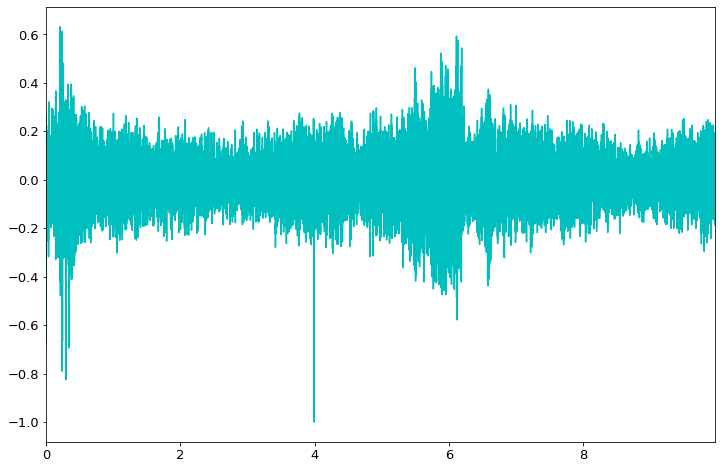

In [67]:
# mosquito waveform
t = np.arange(0,len(mosquito_sound[0])/config.rate,1/config.rate)
plt.plot(t,mosquito_sound[0],color='c')
plt.xlim(t[0],t[-1])

(0.0, 9.964375)

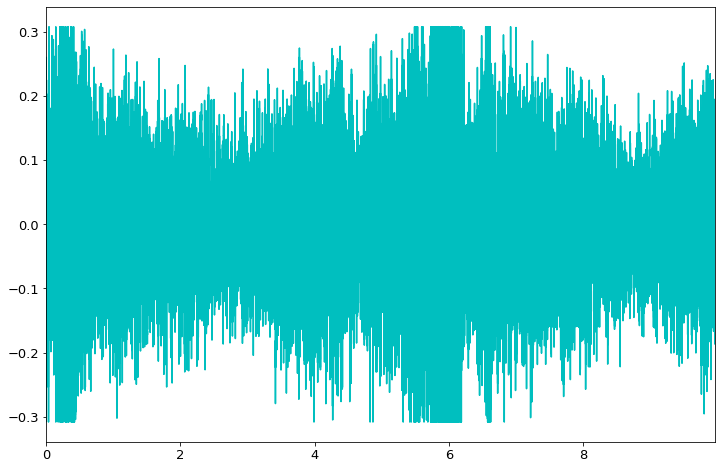

In [68]:
# clamped mosquito waveform
mosquito_sound_clamped = clamp_amplitude(mosquito_sound)
t = np.arange(0,len(mosquito_sound_clamped[0])/config.rate,1/config.rate)
plt.plot(t,mosquito_sound_clamped[0],color='c')
plt.xlim(t[0],t[-1])

In [69]:
# FFT
f = mosquito_sound.numpy()[0]
n = len(t)
dt = 1/config.rate
fhat = np.fft.fft(f[:n],n) # comput fft
PSD = fhat * np.conj(fhat) / n # power spectrum (power per frequency)
freq = (1/(dt*n)) * np.arange(n)
L = np.arange(1,np.floor(n/2),dtype='int')

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:83: ComplexWarning:

Casting complex values to real discards the imaginary part



(0.10035626473982637, 3999.8996437352594)

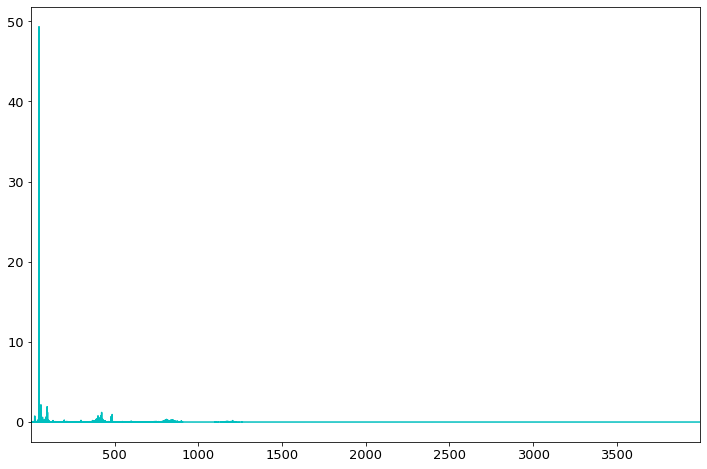

In [70]:
plt.plot(freq[L],PSD[L],color='c')
plt.xlim(freq[L[0]],freq[L[-1]])

In [71]:
def pcen(x, eps=1e-6, s=0.025, alpha=0.98, delta=2, r=0.5, training=False):
    frames = x.split(1, -2)
    m_frames = []
    last_state = None
    for frame in frames:
        if last_state is None:
            last_state = s * frame
            m_frames.append(last_state)
            continue
        if training:
            m_frame = ((1 - s) * last_state).add_(s * frame)
        else:
            m_frame = (1 - s) * last_state + s * frame
        last_state = m_frame
        m_frames.append(m_frame)
    M = torch.cat(m_frames, 1)
    if training:
        pcen_ = (x / (M + eps).pow(alpha) + delta).pow(r) - delta ** r
    else:
        pcen_ = x.div_(M.add_(eps).pow_(alpha)).add_(delta).pow_(r).sub_(delta ** r)
    return pcen_


class PCENTransform(nn.Module):

    def __init__(self, eps=1e-6, s=0.025, alpha=0.98, delta=2, r=0.5, trainable=True):
        super().__init__()
        if trainable:
            self.log_s = nn.Parameter(torch.log(torch.Tensor([s])))
            self.log_alpha = nn.Parameter(torch.log(torch.Tensor([alpha])))
            self.log_delta = nn.Parameter(torch.log(torch.Tensor([delta])))
            self.log_r = nn.Parameter(torch.log(torch.Tensor([r])))
        else:
            self.s = s
            self.alpha = alpha
            self.delta = delta
            self.r = r
        self.eps = eps
        self.trainable = trainable

    def forward(self, x):
#         x = x.permute((0,2,1)).squeeze(dim=1)
        if self.trainable:
            x = pcen(x, self.eps, torch.exp(self.log_s), torch.exp(self.log_alpha), torch.exp(self.log_delta), torch.exp(self.log_r), self.training and self.trainable)
        else:
            x = pcen(x, self.eps, self.s, self.alpha, self.delta, self.r, self.training and self.trainable)
#         x = x.unsqueeze(dim=1).permute((0,1,3,2))
        return x

In [72]:
class Normalization():
    """This class is for normalizing the spectrograms batch by batch. The normalization used is min-max, two modes 'framewise' and 'imagewise' can be selected. In this paper, we found that 'imagewise' normalization works better than 'framewise'"""
    def __init__(self, mode='framewise'):
        if mode == 'framewise':
            def normalize(x):
                size = x.shape
                x_max = x.max(1, keepdim=True)[0] # Finding max values for each frame
                x_min = x.min(1, keepdim=True)[0]  
                output = (x-x_min)/(x_max-x_min) # If there is a column with all zero, nan will occur
                output[torch.isnan(output)]=0 # Making nan to 0
                return output
        elif mode == 'imagewise':
            def normalize(x):
                size = x.shape
                x_max = x.reshape(size[0], size[1]*size[2]).max(1, keepdim=True)[0]
                x_min = x.reshape(size[0], size[1]*size[2]).min(1, keepdim=True)[0]
                x_max = x_max.unsqueeze(1) # Make it broadcastable
                x_min = x_min.unsqueeze(1) # Make it broadcastable 
                return (x-x_min)/(x_max-x_min)
        else:
            print(f'please choose the correct mode')
        self.normalize = normalize

    def __call__(self, x):
        return self.normalize(x)

In [73]:
config.NFFT = 512
config.win_size = 224
config.n_hop = config.NFFT//8
config.step_size = 80

In [74]:
spec_layer = features.STFT(n_fft=config.NFFT, freq_bins=None, hop_length=config.n_hop,
                              window='hann', freq_scale='linear', center=True, pad_mode='reflect',
                          fmin=400, fmax=2000, sr=config.rate, output_format="Magnitude", trainable=False)
norm_layer = Normalization(mode='framewise')
pcen_layer = PCENTransform(eps=1e-6, s=0.025, alpha=0.6, delta=0.1, r=0.2, trainable=False)

sampling rate = 8000. Please make sure the sampling rate is correct in order toget a valid freq range
STFT kernels created, time used = 0.0093 seconds


In [75]:
colors = [(0.12, 0.40, 0.43), (0.78, 0.42, 0.24)]
n_bin = 100  # Discretizes the interpolation into bins
cmap_name = 'my_list'
cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bin)

In [76]:
def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or 'Spectrogram (db)')
    axs.set_ylabel(ylabel)
    axs.set_xlabel('frame')
#     im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
    im = axs.imshow(spec, origin='lower', aspect=aspect, cmap=cmap)
    if xmax:
        axs.set_xlim((0, xmax))
    fig.colorbar(im, ax=axs)
    plt.show(block=False)

In [77]:
mosquito_spec = spec_layer(mosquito_sound)
noisy_mosquito_spec = spec_layer(nosiy_mosquito_sound)
pcen_noisy_mosquito_spec = pcen_layer(noisy_mosquito_spec)
norm_pcen_nosily_mosquito_spec = norm_layer(pcen_noisy_mosquito_spec)

In [78]:
nosiy_mosquito_sound

tensor([[-0.0342, -0.3963, -0.6255,  ..., -0.0193, -0.0075, -0.0053]])

In [79]:
colors = [(0.12, 0.40, 0.43), (0.78, 0.42, 0.24)]
n_bin = 100  # Discretizes the interpolation into bins
cmap_name = 'my_list'
cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bin)

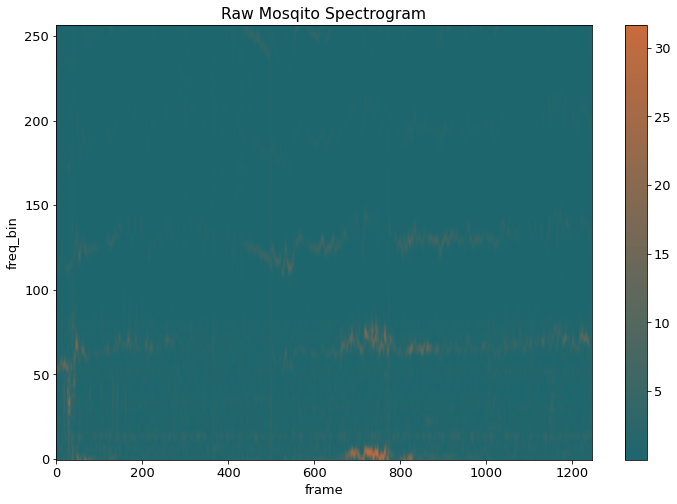

In [80]:
plot_spectrogram(mosquito_spec[0], title="Raw Mosqito Spectrogram")

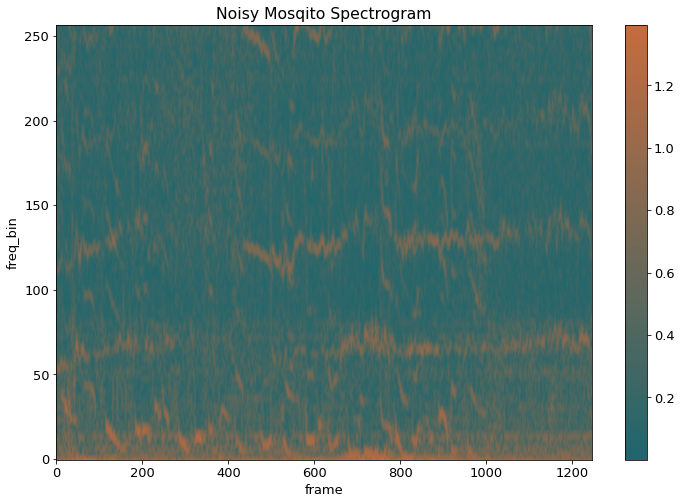

In [81]:
plot_spectrogram(noisy_mosquito_spec[0], title="Noisy Mosqito Spectrogram")

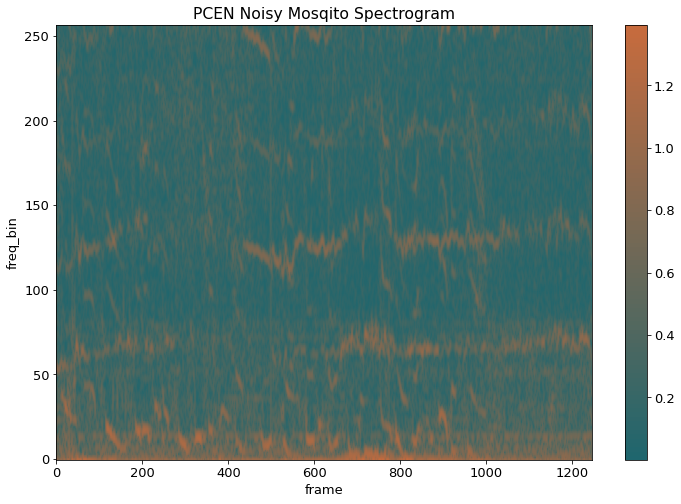

In [82]:
plot_spectrogram(pcen_noisy_mosquito_spec[0], title="PCEN Noisy Mosqito Spectrogram")

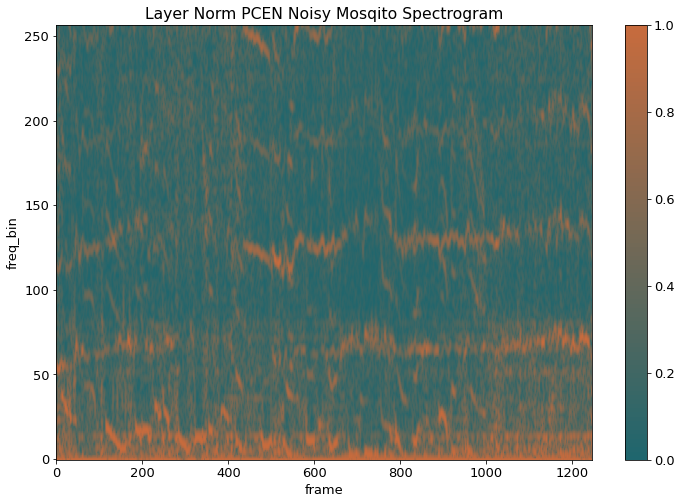

In [83]:
plot_spectrogram(norm_pcen_nosily_mosquito_spec[0], title="Layer Norm PCEN Noisy Mosqito Spectrogram")

Interactive Spectrograms

In [84]:
import plotly.express as px

In [89]:
def plot_spectrogram_2(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None):
#     fig = plt.subplots(0)
#     axs.set_title(title or 'Spectrogram (db)')
#     axs.set_ylabel(ylabel)
#     axs.set_xlabel('frame')
#     im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
#     axs.set_ylabel(ylabel)
    fig = px.imshow(spec, labels=dict(x="Frame", y="Frequency"), origin='lower', aspect=aspect, color_continuous_scale=['#1E656D','#C66B3D'])
#     if xmax:
#         axs.set_xlim((0, xmax))
#     fig.colorbar(im, ax=axs)
    fig.show(block=False)

In [90]:
plot_spectrogram_2(noisy_mosquito_spec[0], title="Noisy Mosqito Spectrogram")